<a href="https://colab.research.google.com/github/jideilori/DepthNet/blob/main/Depth_Net_From_DeFeat_Net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TensorFlow ResNet18 

## ResNet18 Architecture built from pytorch ResNet18 visualized using [Netron](https://lutzroeder.github.io/netron/)

In [1]:
from keras import backend as K
K.get_session().graph.get_collection('variables')
K.clear_session()

from tensorflow.keras.layers import Dense, Conv2D,  MaxPool2D, Flatten, GlobalAveragePooling2D, \
BatchNormalization, Layer, Add,ZeroPadding2D, Activation

from tensorflow.keras.models import Model
import tensorflow as tf


inp = tf.keras.layers.Input(shape=(None,None,3),name='input')
x = Conv2D(filters=64, kernel_size=7,strides=2,padding="same",kernel_initializer='he_normal',use_bias=False,name="conv1")(inp)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="bn1")(x)
x = Activation('relu',name="relu")(x)
x = MaxPool2D((3,3),strides=2,padding="same",name="maxpool")(x)

bb21= x
#LAYER_____1###################################################################################
#LAYER_____1###################################################################################
# # ############################ Basic Block 0 (2-1) ################################
x = Conv2D(filters=64, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer1.0.conv1")(bb21)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer1.0.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=64, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer1.0.conv2")(x)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer1.0.bn2")(x)


bb22 = Add()([bb21,x])
bb22 = Activation('relu')(bb22)
# # ############################ Basic Block 1 (2-2)################################
x = Conv2D(filters=64, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer1.1.conv1")(bb22)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer1.1.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=64, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer1.1.conv2")(x)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer1.1.bn2")(x)

bb23 = Add()([bb22,x])
bb23 = Activation('relu')(bb23)

# #LAYER_____2###################################################################################
# #LAYER_____2###################################################################################
# # # ############################ Basic Block 0 (2-3)################################
x = Conv2D(filters=128, kernel_size=3,strides=2,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer2.0.conv1")(bb23)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer2.0.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=128, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer2.0.conv2")(x)
bnx = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer2.0.bn2")(x)

seq_down_23_model = Conv2D(filters=128, kernel_size=1,strides=2,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer2.0.downsample.0")(bb23) 
seq_down_23_model = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer2.0.downsample.1")(seq_down_23_model)
x = seq_down_23_model

bb24 = Add()([bnx,x])
bb24 = Activation('relu')(bb24)

# # ############################## Basic Block 1 (2-4)################################
x = Conv2D(filters=128, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer2.1.conv1")(bb24)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer2.1.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=128, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer2.1.conv2")(x)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer2.1.bn2")(x)


bb25 = Add()([bb24,x])
bb25 = Activation('relu')(bb25)

# #LAYER_____3###################################################################################
# #LAYER_____3###################################################################################
# ############################### Basic Block 0 (2-5)################################
x = Conv2D(filters=256, kernel_size=3,strides=2,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer3.0.conv1")(bb25)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer3.0.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=256, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer3.0.conv2")(x)
bnx = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer3.0.bn2")(x)

seq_down_25_model = Conv2D(filters=256, kernel_size=1,strides=2,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer3.0.downsample.0")(bb25) 
seq_down_25_model = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer3.0.downsample.1")(seq_down_25_model)
x = seq_down_25_model

bb26 = Add()([bnx,x])
bb26 = Activation('relu')(bb26)

# ############################### Basic Block 1 (2-6)################################
x = Conv2D(filters=256, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer3.1.conv1")(bb26)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer3.1.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=256, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer3.1.conv2")(x)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer3.1.bn2")(x)

bb27 = Add()([bb26,x])
bb27 = Activation('relu')(bb27)


# # LAYER_____4####################################################################################
# # LAYER_____4####################################################################################
# ############################### Basic Block 0 (2-7)################################
x = Conv2D(filters=512, kernel_size=3,strides=2,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer4.0.conv1")(bb27)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer4.0.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=512, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer4.0.conv2")(x)
bnx = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer4.0.bn2")(x)


seq_down_27_model = Conv2D(filters=512, kernel_size=1,strides=2,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer4.0.downsample.0")(bb27) 
seq_down_27_model = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer4.0.downsample.1")(seq_down_27_model)
x = seq_down_27_model


bb28 = Add()([bnx,x])
bb28 = Activation('relu')(bb28)

# ############################### Basic Block 1 (2-8)################################
x = Conv2D(filters=512, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer4.1.conv1")(bb28)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer4.1.bn1")(x)
x = Activation('relu')(x)
x = Conv2D(filters=512, kernel_size=3,strides=1,padding="same",kernel_initializer='he_normal',use_bias=False,name="layer4.1.conv2")(x)
x = BatchNormalization(momentum=0.1, epsilon=1e-5,name="layer4.1.bn2")(x)


bb29 = Add()([bb28,x])
bb29 = Activation('relu')(bb29)
x=bb29


##################################################################################
x = GlobalAveragePooling2D(name='avgpool')(x)
x = Flatten()(x)
x = Dense(1000,use_bias=True,name='fc')(x)
res_model =tf.keras.Model(inputs =inp,outputs=x)

res_model.summary()



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1 (Conv2D)                 (None, None, None,   9408        ['input[0][0]']                  
                                64)                                                               
                                                                                                  
 bn1 (BatchNormalization)       (None, None, None,   256         ['conv1[0][0]']                  
                                64)                                                           

## Visualize TensorFlow ResNet18

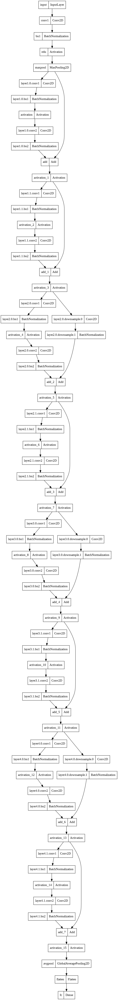

In [2]:
from tensorflow.keras.utils import plot_model
plot_model(res_model, "tf_resnet18.png")

## Copy weights from PyTorch's ResNet18

In [3]:
import torch
from torchvision import models # import pre trained model
resnet_torch =  models.resnet18(pretrained=True)
tf_layer_names = [layer.name for layer in res_model.layers]
torch_layer_names = []
for name, module in resnet_torch.named_modules():
    torch_layer_names.append(name)
# print(torch_layer_names)
tf_layer_names = [layer for layer in tf_layer_names if layer in torch_layer_names]
# print(tf_layer_names)

for layer in tf_layer_names:
    if 'conv' in layer:
        tf_conv = res_model.get_layer(layer)
        weights = resnet_torch.state_dict()[layer+'.weight'].numpy()
        weights_list = [weights.transpose((2, 3, 1, 0))]
        if len(tf_conv.weights) == 2:
            bias = resnet_torch.state_dict()[layer+'.bias'].numpy()
            weights_list.append(bias)
        tf_conv.set_weights(weights_list)
        # tf_conv.kernel.assign(weights_list[0])

    elif 'bn' in layer:
        tf_bn = res_model.get_layer(layer)
        gamma = resnet_torch.state_dict()[layer+'.weight'].numpy()
        beta = resnet_torch.state_dict()[layer+'.bias'].numpy()
        mean = resnet_torch.state_dict()[layer+'.running_mean'].numpy()
        var = resnet_torch.state_dict()[layer+'.running_var'].numpy()
        bn_list = [gamma, beta, mean, var]
        tf_bn.set_weights(bn_list)

    elif 'downsample.0' in layer:
        tf_downsample = res_model.get_layer(layer)
        weights = resnet_torch.state_dict()[layer+'.weight'].numpy()
        weights_list = [weights.transpose((2, 3, 1, 0))]
        if len(tf_downsample.weights) == 2:
            bias = resnet_torch.state_dict()[layer+'.bias'].numpy()
            weights_list.append(bias)
        tf_downsample.set_weights(weights_list)
        # tf_downsample.kernel.assign(weights_list[0])

    elif 'downsample.1' in layer:
        tf_downsample = res_model.get_layer(layer)
        gamma = resnet_torch.state_dict()[layer+'.weight'].numpy()
        beta = resnet_torch.state_dict()[layer+'.bias'].numpy()
        mean = resnet_torch.state_dict()[layer+'.running_mean'].numpy()
        var = resnet_torch.state_dict()[layer+'.running_var'].numpy()
        bn_list = [gamma, beta, mean, var] # [gamma, beta, mean, var]
        tf_downsample.set_weights(bn_list)

    elif 'fc' in layer:
        tf_fc = res_model.get_layer(layer)
        weights = resnet_torch.state_dict()[layer+'.weight'].numpy() 
        weights_list = [weights.transpose((1, 0))]
        if len(tf_fc.weights) == 2:
            bias = resnet_torch.state_dict()[layer+'.bias'].numpy()
            weights_list.append(bias)
        tf_fc.set_weights(weights_list)
        # tf_fc.kernel.assign(weights_list[0])
    else:
        print('No parameters found for {}'.format(layer))


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

No parameters found for relu
No parameters found for maxpool
No parameters found for avgpool


# Downloading the dataset

In [4]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = tf.keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,
    )

2774638592/2774625282 [==============================] - 51s 0us/step


# Preparing the Dataset

In [5]:
path = "val/indoors"
filelist = []
for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

In [6]:
HEIGHT = 256
WIDTH = 256
LR = 0.0002
EPOCHS = 30
BATCH_SIZE = 32

# Building a data pipeline

In [7]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        return x, y


# Visualizing samples

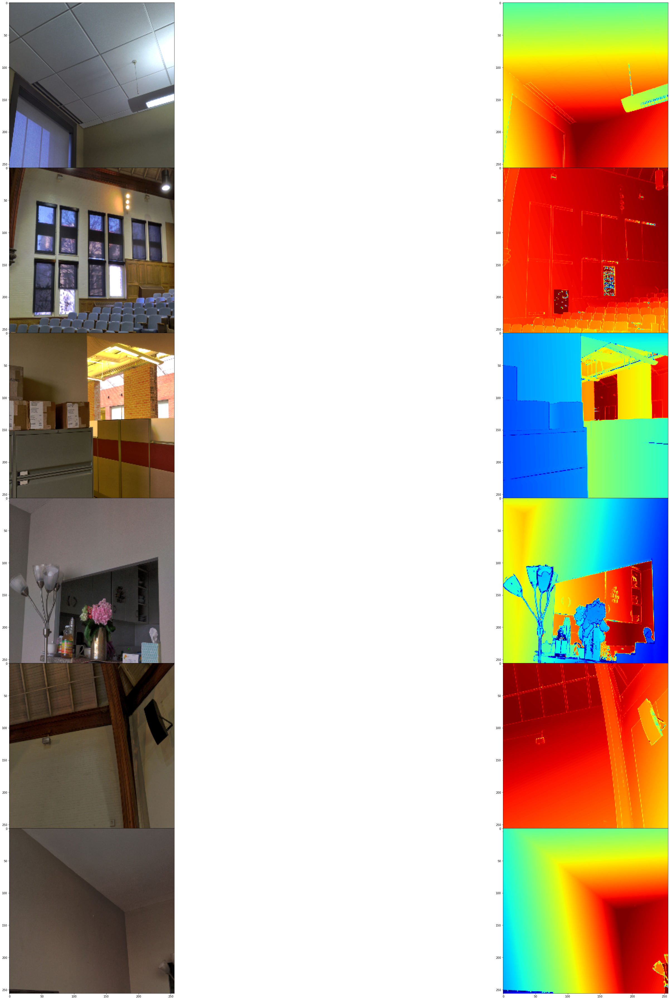

In [21]:
import numpy as np
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        fig.subplots_adjust(wspace=0, hspace=0)

        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        fig.tight_layout()

        fig.subplots_adjust(wspace=0, hspace=0)

        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)
visualize_depth_map(visualize_samples)

In [ ]:
# depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
# img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

# fig = plt.figure(figsize=(15, 10))
# ax = plt.axes(projection="3d")

# STEP = 3
# for x in range(0, img_vis.shape[0], STEP):
#     for y in range(0, img_vis.shape[1], STEP):
#         ax.scatter(
#             [depth_vis[x, y]] * 3,
#             [y] * 3,
#             [x] * 3,
#             c=tuple(img_vis[x, y, :3] / 255),
#             s=3,
#         )
#     ax.view_init(45, 135)

# Building the Model and defining loss

In [49]:
from collections import OrderedDict
import numpy as np
from keras.layers import Concatenate
from keras import backend as K
from collections import OrderedDict

import tensorflow as tf
from keras.layers import Lambda
import numpy as np


class TF_simple_conv_block_new(tf.keras.layers.Layer):
    def __init__(self,in_channels,out_channels):
        super(TF_simple_conv_block_new, self).__init__()
        self.conv = TF_conv_3x3_new(in_channels,out_channels)
        self.nonlin = tf.keras.layers.ELU(alpha=1.0)
    def call(self, inputs):
      return self.nonlin(self.conv(inputs))
    
class TF_conv_3x3_new(tf.keras.layers.Layer):
    def __init__(self,in_channels, out_channels, use_refl=True):
        super(TF_conv_3x3_new, self).__init__()
        self.reflect_pad = Lambda(lambda x: tf.pad(x, [[0,0],[1,1],[1,1],[0,0]], 'REFLECT'))
        self.zeropad = Lambda(lambda x:tf.pad(x,[[0,0],[1,1],[1,1],[0,0]],'CONSTANT'))
        if use_refl:
          self.pad = self.reflect_pad
        else:
          self.pad = self.zeropad
        self.conv = tf.keras.layers.Conv2D(out_channels,3)

    def call(self, inputs):
      return self.conv(self.pad(inputs))


class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = tf.keras.metrics.Mean(name="loss")
       
        self.tf_num_layers: int = 18 #choices=[18, 34, 50, 101, 152]
        self.tf_scales: list = range(4)  #0,1,2,3 
        self.tf_use_skips: bool = True
      
        self.tf_enc_ch = np.array([64, 64, 128, 256, 512])
        self.tf_dec_ch = np.array([16, 32, 64, 128, 256])
        if self.tf_num_layers > 34:
          self.tf_enc_ch[1:] *= 4

        # Build multiscale decoder
        self.tf_convs = OrderedDict() 
        for i in range(4, -1, -1):
            self.tf_in_ch = self.tf_enc_ch[-1] if i == 4 else self.tf_dec_ch[i + 1]
            self.tf_convs[('upconv', i, 0)] = TF_simple_conv_block_new(self.tf_in_ch, self.tf_dec_ch[i])

            self.tf_in_ch = self.tf_dec_ch[i] + (self.tf_enc_ch[i - 1] if self.tf_use_skips and i > 0 else 0)
            self.tf_convs[('upconv', i, 1)] = TF_simple_conv_block_new(self.tf_in_ch, self.tf_dec_ch[i])

        # Upsample convs for each scale
        for s in self.tf_scales:
            self.tf_convs[('dispconv', s)] = TF_conv_3x3_new(self.tf_dec_ch[s], 1)
            
            
        self.conv_layer = Conv2D(1, (1, 1), padding="same", activation="tanh")


    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01 ** 2, k2=0.03 ** 2
            )
        )
        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        tf_features, tf_outputs = [], {}
        inp_tfx = (x - 0.45) / 0.225


        tfx = res_model.get_layer('conv1')(inp_tfx)
        tfx = res_model.get_layer('bn1')(tfx)
        tf_features.append(res_model.get_layer('relu')(tfx))
        tf_features.append(res_model.get_layer('layer1.0.conv1')(res_model.get_layer('maxpool')(tf_features[-1])))
        tf_features.append(res_model.get_layer('layer2.0.conv1')(tf_features[-1]))
        tf_features.append(res_model.get_layer('layer3.0.conv1')(tf_features[-1]))
        tf_features.append(res_model.get_layer('layer4.0.conv1')(tf_features[-1]))


        # Decoder
        x = tf_features[-1]        
        for i in range(4, -1, -1):
          x = self.tf_convs[('upconv', i, 0)](x)
          x = tf.keras.layers.UpSampling2D()(x)
          if self.tf_use_skips and i > 0:
              x = Concatenate(axis=3)([x, tf_features[i - 1]])
          x=self.tf_convs[('upconv', i, 1)](x)
          if i in self.tf_scales:
              out = self.tf_convs[('dispconv', i)](x)
              
        return out

# MODEL TRAINING

In [50]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=False,
)
model = DepthEstimationModel()
# Define the loss function
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction="none"
)
# Compile the model
model.compile(optimizer, loss=cross_entropy)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)


In [56]:
model.fit(
    train_loader,
    epochs=4,
    validation_data=validation_loader
)

Epoch 1/4
65/65 [==============================] - 17s 266ms/step - loss: 0.2354 - val_loss: 0.2359
Epoch 2/4
65/65 [==============================] - 15s 232ms/step - loss: 0.2412 - val_loss: 0.2422
Epoch 3/4
65/65 [==============================] - 17s 270ms/step - loss: 0.2302 - val_loss: 0.2353
Epoch 4/4
65/65 [==============================] - 15s 232ms/step - loss: 0.2299 - val_loss: 0.2388


# Testing

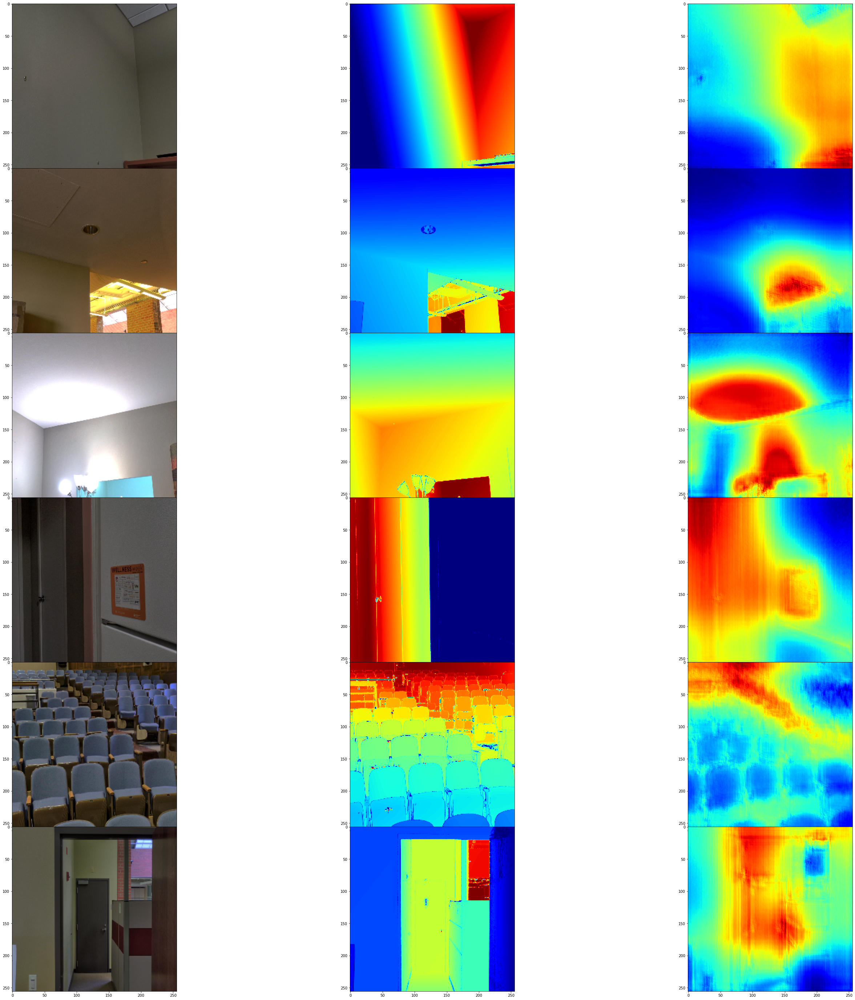

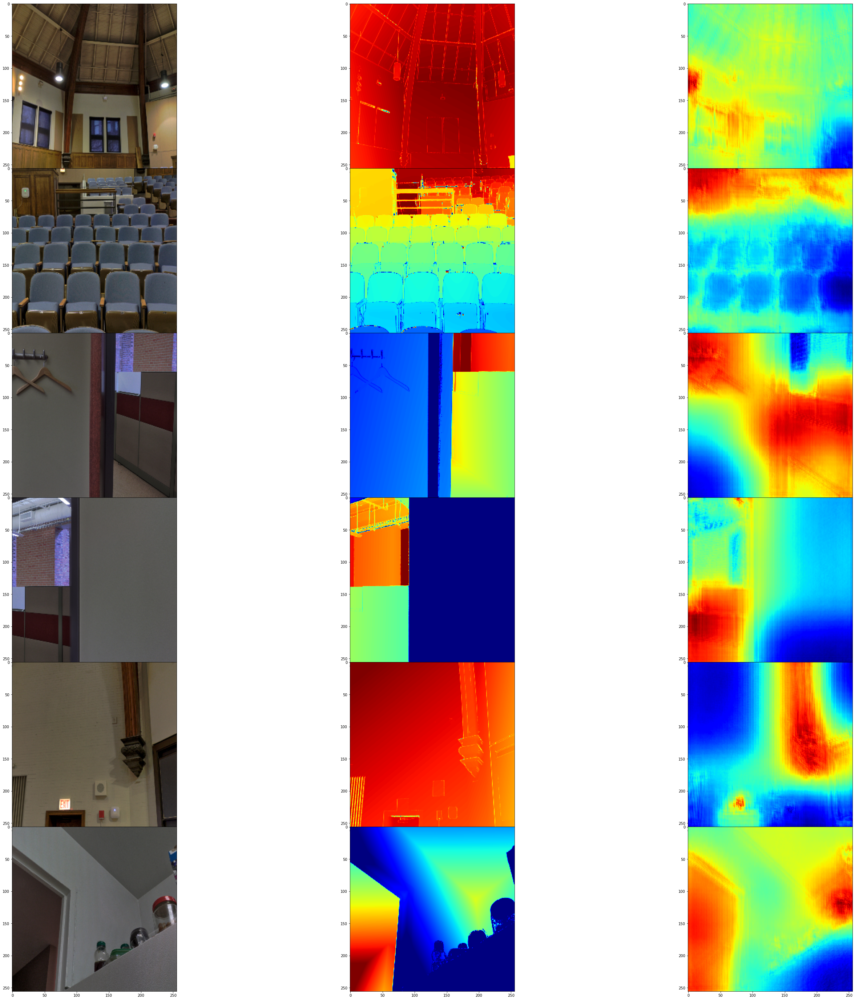

In [57]:
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

(256, 256, 3)
(1, 256, 256, 3)
(256, 256)


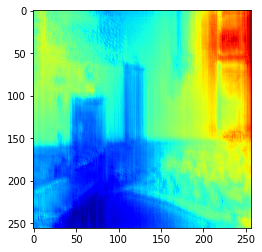

In [66]:
import cv2
img_test = cv2.imread('/content/val/indoors/scene_00019/scan_00183/00019_00183_indoors_000_010.png')
img_test = cv2.resize(img_test,(256,256))
print(img_test.shape)
img_test = np.expand_dims(img_test,0)
img_test = (img_test - 0.45) / 0.225

print(img_test.shape)

result = model.predict(img_test)
ff = result.squeeze(0)
ff = ff.squeeze(2)
print(ff.shape)
plt.imshow(ff,cmap='jet')